Import Libraries

In [ ]:
import nltk
nltk.download('punkt')

In [46]:
import pandas

from ipydatagrid import DataGrid

from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cluster import AgglomerativeClustering

from scipy.cluster import hierarchy

from matplotlib import pyplot as plt

from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize

Import Data

In [47]:
# dataset can be found here https://www.kaggle.com/datasets/imtkaggleteam/netflix
dataframe = pandas.read_csv('NetFlix.csv')

DataGrid(dataframe)

DataGrid(auto_fit_params={'area': 'all', 'padding': 30, 'numCols': None}, corner_renderer=None, default_render…

Fill Blank Cells of Elements Used to Check for Similarity

In [48]:
elements = ['type', 'director', 'cast', 'country', 'release_year', 'rating', 'genres', 'description']

for element in elements:
    dataframe[element] = dataframe[element].fillna('')

dataframe.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,genres,description
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,14-Aug-20,2020,TV-MA,4,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s10,Movie,1920,Vikram Bhatt,"Rajneesh Duggal, Adah Sharma, Indraneil Sengup...",India,15-Dec-17,2008,TV-MA,143,"Horror Movies, International Movies, Thrillers",An architect and his wife move into a castle t...
2,s100,Movie,3 Heroines,Iman Brotoseno,"Reza Rahadian, Bunga Citra Lestari, Tara Basro...",Indonesia,5-Jan-19,2016,TV-PG,124,"Dramas, International Movies, Sports Movies",Three Indonesian women break records by becomi...
3,s1000,Movie,Blue Mountain State: The Rise of Thadland,Lev L. Spiro,"Alan Ritchson, Darin Brooks, James Cade, Rob R...",United States,1-Mar-16,2016,R,90,Comedies,New NFL star Thad buys his old teammates' belo...
4,s1001,TV Show,Blue Planet II,,David Attenborough,United Kingdom,3-Dec-18,2017,TV-G,1,"British TV Shows, Docuseries, Science & Nature TV",This sequel to the award-winning nature series...


Pre-Process Data

In [49]:
# splitting Dataframes
cos_sim_df = dataframe.copy() # Cosine Similarity Dataframe
h_cluster_df = dataframe.copy() # Hierchial Clustering Dataframe

In [50]:
# encoding categorical variables

# title is excluded and is processed to be used for descriptive elements

# vectorizer seems to do some of this as well, though doesn't hurt
def process_data(data):
    clean_data = str(data).lower()
    clean_data = clean_data.replace(' ','')
    clean_data = clean_data.replace(',',' ')
    clean_data = clean_data.replace('\'s','')
    return clean_data

def process_title(title):
    clean_title = str(title).lower()
    clean_title = clean_title.replace(',',' ')
    clean_title = clean_title.replace(':','')
    clean_title = clean_title.replace('\'s','')
    return clean_title

cos_sim_df['type'] = cos_sim_df['type'].apply(process_data)
cos_sim_df['title'] = cos_sim_df['title'].apply(process_title)
cos_sim_df['director'] = cos_sim_df['director'].apply(process_data)
cos_sim_df['cast'] = cos_sim_df['cast'].apply(process_data)
cos_sim_df['country'] = cos_sim_df['country'].apply(process_data)
cos_sim_df['release_year'] = cos_sim_df['release_year'].apply(process_data)
cos_sim_df['genres'] = cos_sim_df['genres'].apply(process_data)

processed_data = cos_sim_df[['type', 'title', 'director', 'cast', 'country', 'release_year', 'genres']]
print(processed_data)

        type                                     title            director  \
0     tvshow                                        3%                       
1      movie                                      1920         vikrambhatt   
2      movie                                3 heroines       imanbrotoseno   
3      movie  blue mountain state the rise of thadland          levl.spiro   
4     tvshow                            blue planet ii                       
...      ...                                       ...                 ...   
7782  tvshow                                blown away                       
7783  tvshow                             blue exorcist                       
7784   movie                 blue is the warmest color  abdellatifkechiche   
7785   movie                              blue jasmine          woodyallen   
7786   movie                                  blue jay         alexlehmann   

                                                   cast        

Combine Elements

In [51]:
def combine_elements(row):
    # return row['title']+" "+row['type']+" "+row['director']+" "+row['cast']+" "+row['country']+" "+row['release_year']+" "+row['rating']+" "+row['genres']+" "+row['description']

    return row['rating']+" "+row['genres']+" "+row['description']
    # seems to be the most useful
    
    # type is not meaningful enough, cast could be meanigful in some situations though seems to muddy the waters more than anything else, same with release year
    # it's possible weighting or scaling these values in some way could help with this 

cos_sim_df["combined_elements"] = cos_sim_df.apply(combine_elements,axis=1) # creating and populating combined elements column

print(cos_sim_df['combined_elements'])

0       TV-MA internationaltvshows tvdramas tvsci-fi&f...
1       TV-MA horrormovies internationalmovies thrille...
2       TV-PG dramas internationalmovies sportsmovies ...
3       R comedies New NFL star Thad buys his old team...
4       TV-G britishtvshows docuseries science&naturet...
                              ...                        
7782    TV-14 internationaltvshows realitytv Ten maste...
7783    TV-MA animeseries internationaltvshows Determi...
7784    NC-17 dramas independentmovies internationalmo...
7785    PG-13 comedies dramas independentmovies The hi...
7786    TV-MA dramas independentmovies romanticmovies ...
Name: combined_elements, Length: 7787, dtype: object


Utilizing NLTK Word Stemming

In [52]:
# seemed to hurt more than help, it's possible the stems convey some useful information about tone or something else

"""stemmer = PorterStemmer()

def stem_words(element):
    stem_ele = ""
    words = word_tokenize(element)
    for w in words:
        stem_ele += stemmer.stem(w)
        stem_ele += " "
    return stem_ele
    

cos_sim_df['combined_elements'] = cos_sim_df['combined_elements'].apply(stem_words)

print(cos_sim_df['combined_elements'])"""

'stemmer = PorterStemmer()\n\ndef stem_words(element):\n    stem_ele = ""\n    words = word_tokenize(element)\n    for w in words:\n        stem_ele += stemmer.stem(w)\n        stem_ele += " "\n    return stem_ele\n    \n\ncos_sim_df[\'combined_elements\'] = cos_sim_df[\'combined_elements\'].apply(stem_words)\n\nprint(cos_sim_df[\'combined_elements\'])'

Inputting Combined Elements into Count Vectorizer

In [53]:
# uses standard stop word filter
vectorizor = CountVectorizer(strip_accents='unicode', lowercase=True, stop_words='english')

vector_model = vectorizor.fit_transform(cos_sim_df["combined_elements"])

print(vector_model)

  (0, 16569)	1
  (0, 9557)	1
  (0, 8241)	1
  (0, 16572)	1
  (0, 16575)	1
  (0, 5995)	1
  (0, 5841)	1
  (0, 6509)	1
  (0, 5171)	1
  (0, 8113)	1
  (0, 8377)	1
  (0, 11497)	1
  (0, 5842)	1
  (0, 3835)	1
  (0, 14701)	1
  (0, 2742)	1
  (0, 8566)	1
  (0, 13896)	1
  (0, 15083)	1
  (1, 16569)	1
  (1, 9557)	1
  (1, 7640)	1
  (1, 8240)	1
  (1, 16080)	1
  (1, 989)	1
  :	:
  (7785, 9125)	1
  (7785, 7570)	1
  (7785, 3797)	1
  (7785, 9264)	1
  (7785, 10349)	1
  (7785, 896)	1
  (7785, 5867)	1
  (7786, 16569)	1
  (7786, 9557)	1
  (7786, 4862)	1
  (7786, 11131)	1
  (7786, 13964)	1
  (7786, 8017)	1
  (7786, 7577)	1
  (7786, 13618)	1
  (7786, 7448)	1
  (7786, 12984)	1
  (7786, 5758)	1
  (7786, 9600)	1
  (7786, 13365)	1
  (7786, 1994)	1
  (7786, 16729)	1
  (7786, 13046)	1
  (7786, 14312)	1
  (7786, 15643)	1


Computing Cosine Similarity Matrix

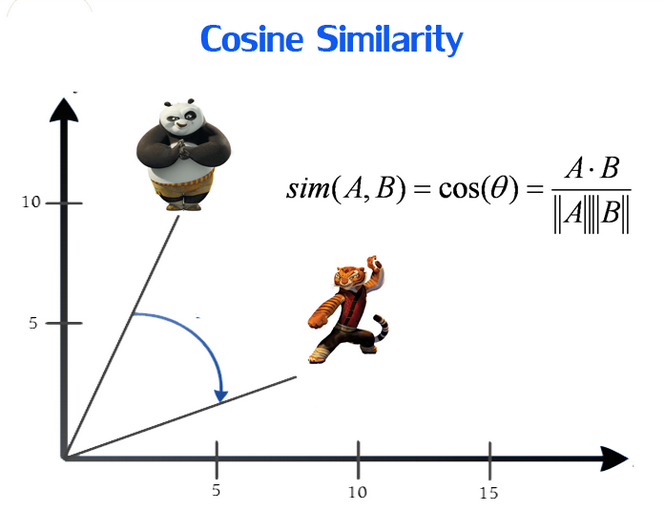
(Image Credit: https://dataaspirant.com/five-most-popular-similarity-measures-implementation-in-python/)

In [54]:
cos_sim = cosine_similarity(vector_model) 

print(cos_sim)

[[1.         0.11846978 0.05735393 ... 0.         0.         0.10814761]
 [0.11846978 1.         0.12909944 ... 0.11268723 0.         0.12171612]
 [0.05735393 0.12909944 1.         ... 0.10910895 0.10425721 0.11785113]
 ...
 [0.         0.11268723 0.10910895 ... 1.         0.09100315 0.15430335]
 [0.         0.         0.10425721 ... 0.09100315 1.         0.19658927]
 [0.10814761 0.12171612 0.11785113 ... 0.15430335 0.19658927 1.        ]]


Integrating Cosine Similarity Matrix into Cosine Similarity Dataframe

In [55]:
cos_sim_df = pandas.DataFrame(cos_sim, columns=dataframe['title'], index=dataframe['title']).reset_index()

cos_sim_df.head()

title,title,3%,1920,3 Heroines,Blue Mountain State: The Rise of Thadland,Blue Planet II,Blue Ruin,Blue Streak,Blue Valentine,BluffMaster!,...,Blood Pact,Blood Will Tell,Bloodline,Bloodride,Blow,Blown Away,Blue Exorcist,Blue Is the Warmest Color,Blue Jasmine,Blue Jay
0,3%,1.000000,0.118470,0.057354,0.0,0.050063,0.00000,0.000000,0.00000,0.055641,...,0.234146,0.111283,0.162221,0.157895,0.000000,0.162221,0.157895,0.000000,0.000000,0.108148
1,1920,0.118470,1.000000,0.129099,0.0,0.056344,0.06455,0.000000,0.00000,0.125245,...,0.158114,0.250490,0.121716,0.118470,0.000000,0.060858,0.177705,0.112687,0.000000,0.121716
2,3 Heroines,0.057354,0.129099,1.000000,0.0,0.054554,0.00000,0.058926,0.06455,0.121268,...,0.102062,0.181902,0.058926,0.057354,0.072169,0.058926,0.057354,0.109109,0.104257,0.117851
3,Blue Mountain State: The Rise of Thadland,0.000000,0.000000,0.000000,1.0,0.000000,0.00000,0.054074,0.00000,0.055641,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.050063,0.095673,0.108148
4,Blue Planet II,0.050063,0.056344,0.054554,0.0,1.000000,0.00000,0.000000,0.00000,0.052926,...,0.089087,0.052926,0.051434,0.100125,0.000000,0.051434,0.050063,0.047619,0.000000,0.051434


Hierarchial Cluster Controls

In [56]:
threshold = 15
linkage = 'ward'
metric = 'euclidean'

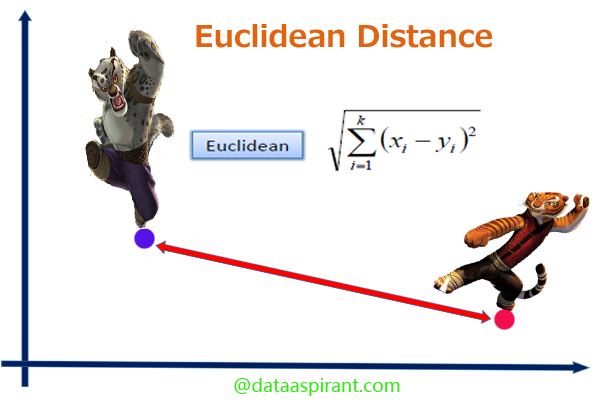
(Image Credit: https://dataaspirant.com/five-most-popular-similarity-measures-implementation-in-python/)

Graphing Hierarchical Cluster Dendrogram with Cosine Similarity Matrix ***May take a few minutes - UserWarnings will appear - Image will be quite large and appear below warnings***

In [57]:
plt.figure(figsize=[13, 650])

dendrogram = hierarchy.linkage(cos_sim, method=linkage, metric=metric)
den_graph = hierarchy.dendrogram(dendrogram, color_threshold=threshold, orientation='right', labels=dataframe['title'].to_list())

# a standard hiearchial cluster threshold might be made here, though for this case, clusters are much too large as they are ultimately the constraining factor
plt.axvline(x=75, c='grey', lw=1, linestyle='dashed') 

# seems to provide (with the metrics used in this particular model) both a reasonable amount of clusters and a reasonable size of each indivdual cluster
plt.axvline(x=threshold, c='grey', lw=1, linestyle='dashed') 



c:\Users\B\AppData\Local\Programs\Python\Python312\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 48152 (\N{HANGUL SYLLABLE BAN}) missing from current font.
  func(*args, **kwargs)
c:\Users\B\AppData\Local\Programs\Python\Python312\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 46300 (\N{HANGUL SYLLABLE DEU}) missing from current font.
  func(*args, **kwargs)
c:\Users\B\AppData\Local\Programs\Python\Python312\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 49884 (\N{HANGUL SYLLABLE SI}) missing from current font.
  func(*args, **kwargs)
c:\Users\B\AppData\Local\Programs\Python\Python312\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 51105 (\N{HANGUL SYLLABLE JAB}) missing from current font.
  func(*args, **kwargs)
c:\Users\B\AppData\Local\Programs\Python\Python312\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 45716 (\N{HANGUL SYLLABLE NEUN}) missing from current font.
  func(*args, **kwargs)
c:\Users\B

Computing Hierarchical Clusters with Cosine Similarity Matrix ***May take a few minutes***

In [58]:
h_clustering = AgglomerativeClustering(n_clusters=None, metric=metric, compute_full_tree=True, linkage=linkage, distance_threshold=threshold).fit(cos_sim)

print("Total CLusters - " + str(h_clustering.n_clusters_))


Total CLusters - 88


Integrating Cluster Column into Cluster Dataframe

In [59]:
h_cluster_df['cluster'] = h_clustering.labels_

h_cluster_df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,genres,description,cluster
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,14-Aug-20,2020,TV-MA,4,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,9
1,s10,Movie,1920,Vikram Bhatt,"Rajneesh Duggal, Adah Sharma, Indraneil Sengup...",India,15-Dec-17,2008,TV-MA,143,"Horror Movies, International Movies, Thrillers",An architect and his wife move into a castle t...,35
2,s100,Movie,3 Heroines,Iman Brotoseno,"Reza Rahadian, Bunga Citra Lestari, Tara Basro...",Indonesia,5-Jan-19,2016,TV-PG,124,"Dramas, International Movies, Sports Movies",Three Indonesian women break records by becomi...,25
3,s1000,Movie,Blue Mountain State: The Rise of Thadland,Lev L. Spiro,"Alan Ritchson, Darin Brooks, James Cade, Rob R...",United States,1-Mar-16,2016,R,90,Comedies,New NFL star Thad buys his old teammates' belo...,87
4,s1001,TV Show,Blue Planet II,,David Attenborough,United Kingdom,3-Dec-18,2017,TV-G,1,"British TV Shows, Docuseries, Science & Nature TV",This sequel to the award-winning nature series...,36


Finding Recommendations 

In [303]:
movie_or_show = 'Stranger Things'

# ultimately constrained by cluster, some inputs required a larger N to fully populate a cross-referenced Top-10 Featured List(see Next Section)
n_recommendations = 150

In [304]:
# locating row of input movie or show by matching title
movie_show_row = h_cluster_df.loc[h_cluster_df['title'] == movie_or_show]

# extracting all movies and shows by matching cluster
clu_recommendations = h_cluster_df.loc[h_cluster_df['cluster'] == movie_show_row['cluster'].loc[movie_show_row.index[0]]]

print("Similar Movies and Shows in Hierarchical Cluster - " + str(clu_recommendations['title'].count() - 1) + "\n") # subtracting input movie or show from count
print([r for r in clu_recommendations['title'] if r != movie_or_show])

Similar Movies and Shows in Hierarchical Cluster - 76

["Border Security: America's Front Line", 'Bountiful Blessings', 'Charmed', 'Chilling Adventures of Sabrina', 'Chosen', 'Cobra Kai', 'Colony', "DC's Legends of Tomorrow", 'Disenchantment', 'Filinta', 'Halo: The Fall of Reach', 'Handsome Siblings', 'Hell on Wheels', 'Ice Fantasy', 'Iris', 'Jericho', 'Jonathan Strange & Mr Norrell', 'K.O.3an Guo', 'Kaçak', 'Agent Raghav', 'L.A.’s Finest', 'Larceny', 'Legacies', 'Locke & Key', 'Magi: The Labyrinth of Magic', 'Maharakshak Devi', 'Maharakshak: Aryan', "Marvel's Agents of S.H.I.E.L.D.", 'My Country: The New Age', 'Mystery Science Theater 3000', 'Mystery Science Theater 3000: The Return', 'Naruto', 'Once Upon A Time In Lingjian Mountain', 'Person of Interest', 'PILI Fantasy: War of Dragons', 'Planet Hulk', 'Resurrection: Ertugrul', 'Rim of the World', 'Roswell, New Mexico', 'Scissor Seven', 'Shooter', 'Spectral', 'Star Trek', 'Star Trek: Deep Space Nine', 'Star Trek: Enterprise', 'Star-Cr

In [305]:
cos_recommendations = pandas.DataFrame(cos_sim_df.nlargest(n_recommendations + 1, movie_or_show)['title']) # grabbing Top-N + 1 as the first will always be the input

print("Top-" + str(n_recommendations) + " Movies and Shows Ordered by Descending Cosine Similarity\n")
print(cos_recommendations[1:]) # removing input movie or show

Top-150 Movies and Shows Ordered by Descending Cosine Similarity

                              title
4768                  Rowdy Rathore
5325                   Star-Crossed
6352                         The OA
3184               Maharakshak Devi
2469  Jonathan Strange & Mr Norrell
...                             ...
4024                        Onaatah
4088                      Orbiter 9
4354                   Poshter Girl
4698                      Riverdale
5046                       Shanghai

[150 rows x 1 columns]


Cross-Referencing Cluster and Cosine Recomendations into a Top-N Featured List

In [306]:
n_featured_recommendations = 10
featured_recommendations = []

# checking cosine similarity list against cluster, if found in cluster, add to featured
for cos_r in cos_recommendations['title']:
    for cl_r in clu_recommendations['title']:

        if cl_r == cos_r: 
            featured_recommendations.append(cl_r)
    
print("\n*** Top-" + str(n_featured_recommendations) + " Featured Recommendations ***\n")
featured_recommendations = [r for r in featured_recommendations if r != movie_or_show]
print(featured_recommendations[:n_featured_recommendations] ) # limiting to Top-N

print("\n--- " + str(len(featured_recommendations) - n_featured_recommendations) + " Noteworthy Recommendations ---\n")
print(featured_recommendations[n_featured_recommendations:] )


*** Top-10 Featured Recommendations ***

['Star-Crossed', 'Maharakshak Devi', 'Jonathan Strange & Mr Norrell', 'The 4400', 'The Messengers', 'Chilling Adventures of Sabrina', 'Colony', 'Once Upon A Time In Lingjian Mountain', 'The Twilight Zone (Original Series)', 'The Vampire Diaries']

--- 27 Noteworthy Recommendations ---

['Unchained Fate', 'PILI Fantasy: War of Dragons', 'The Umbrella Academy', 'Legacies', 'The Flash', 'Bountiful Blessings', 'Charmed', "DC's Legends of Tomorrow", "Marvel's Agents of S.H.I.E.L.D.", 'The Land of Hypocrisy', 'Disenchantment', 'Handsome Siblings', 'Mystery Science Theater 3000', 'The 100', 'Away', 'Blood & Treasures', 'Maharakshak: Aryan', 'Roswell, New Mexico', 'Supergirl', 'Black Lightning', 'Mystery Science Theater 3000: The Return', 'Star Trek', 'Star Trek: Deep Space Nine', 'Ice Fantasy', 'Star Trek: Enterprise', 'K.O.3an Guo', '2036 Origin Unknown']


Creating a Recommendation Function

In [307]:
def find_recommendations(movie_or_show):

    movie_show_row = h_cluster_df.loc[h_cluster_df['title'] == movie_or_show] 

    clu_recommendations = h_cluster_df.loc[h_cluster_df['cluster'] == movie_show_row['cluster'].loc[movie_show_row.index[0]]] 

    print("Similar Movies and Shows in Hierarchical Cluster - " + str(clu_recommendations['title'].count() - 1) + "\n") 
    print([r for r in clu_recommendations['title'] if r != movie_or_show])
    print("")

    cos_recommendations = pandas.DataFrame(cos_sim_df.nlargest(n_recommendations + 1, movie_or_show)['title'])

    print("Top-" + str(n_recommendations) + " Movies and Shows Ordered by Descending Cosine Similarity\n")
    print(cos_recommendations[1:])

    featured_recommendations = []

    for cos_r in cos_recommendations['title']:
        for clu_r in clu_recommendations['title']:

            if clu_r == cos_r: 
                featured_recommendations.append(clu_r)
    
    print("\n*** Top-" + str(n_featured_recommendations) + " Featured Recommendations ***\n")
    featured_recommendations = [r for r in featured_recommendations if r != movie_or_show]
    print(featured_recommendations[:n_featured_recommendations] )
    
    print("\n--- " + str(len(featured_recommendations) - n_featured_recommendations) + " Noteworthy Recommendations ---\n")
    print(featured_recommendations[n_featured_recommendations:] )



---Show Recommendations---

In [308]:
find_recommendations('Criminal Minds') 

Similar Movies and Shows in Hierarchical Cluster - 137

['Borderline', 'Brown Nation', 'Case Closed', 'Champions', 'Chasing Cameron', "Chewin' the Fat", '7 (Seven)', 'Community', 'Conan Without Borders', 'Dangerous Lies', 'DASH & LILY', "Dawson's Creek", 'Deadcon', 'DeMarcus Family Rules', 'Deviant Love', 'Dismissed', "Dolly Parton's Heartstrings", 'Doomsday Preppers', 'A Haunting at Silver Falls: The Return', 'Dynasty', 'Evil', 'Fanatic', 'Fatal Affair', 'For the Win', 'Forged in Fire', 'Frequency', 'Friends', 'Ghost Town Gold', 'Gilmore Girls', 'Gilmore Girls: A Year in the Life', 'Girlfriends', 'Glee', 'Godzilla', 'Gossip Girl', 'Greenleaf', "Grey's Anatomy", 'Gunslinger Girl', 'Half & Half', 'Halt and Catch Fire', 'A.D. Kingdom and Empire', 'Haven', 'Heartland', 'His House', 'How to Get Away with Murder', 'In The Dark', 'Indian Matchmaking', 'Ink Master', 'Adam Ruins Everything', 'Jane The Virgin', 'Killer Cove', 'AJ and the Queen', 'Life Sentence', 'Lost Girl', 'Lucifer', 'Mad Men

In [309]:
find_recommendations('MINDHUNTER') 

Similar Movies and Shows in Hierarchical Cluster - 103

['Bridgerton', "Can't Cope, Won't Cope", "Chicken Soup for the Soul's Being Dad", 'Club de Cuervos Presents: I, Potro', 'Containment', 'Crazy Ex-Girlfriend', 'Damnation', 'Dead to Me', 'Designated Survivor', 'Dexter', 'Eastsiders', 'Easy', 'Emily in Paris', 'Enemigo íntimo', 'Falsa identidad', 'Family Blood', 'Feel Good', 'Flaked', 'Gentefied', 'Get Shorty', 'Girl on the Third Floor', "Girlfriends' Guide to Divorce", 'GLOW', 'Good Girls', 'Grace and Frankie', 'Gypsy', "A Young Doctor's Notebook and Other Stories", 'Hannibal', 'Hap and Leonard', 'Happyish', 'Haunted', 'Here Alone', 'House of Cards', 'Insatiable', 'Intelligence', 'IZombie', 'Jenni Rivera: Mariposa de Barrio', 'Kingdom', 'Knightfall', 'Last Tango in Halifax', 'Liberated: The New Sexual Revolution', 'Lilyhammer', 'Love', 'Maniac', 'Medal of Honor', 'Messiah', 'Nurse Jackie', 'American Crime Story: The People v. O.J. Simpson', 'Orange Is the New Black', 'Ozark', 'Penny

In [310]:
find_recommendations('Marvel\'s Agents of S.H.I.E.L.D.')

Similar Movies and Shows in Hierarchical Cluster - 76

["Border Security: America's Front Line", 'Bountiful Blessings', 'Charmed', 'Chilling Adventures of Sabrina', 'Chosen', 'Cobra Kai', 'Colony', "DC's Legends of Tomorrow", 'Disenchantment', 'Filinta', 'Halo: The Fall of Reach', 'Handsome Siblings', 'Hell on Wheels', 'Ice Fantasy', 'Iris', 'Jericho', 'Jonathan Strange & Mr Norrell', 'K.O.3an Guo', 'Kaçak', 'Agent Raghav', 'L.A.’s Finest', 'Larceny', 'Legacies', 'Locke & Key', 'Magi: The Labyrinth of Magic', 'Maharakshak Devi', 'Maharakshak: Aryan', 'My Country: The New Age', 'Mystery Science Theater 3000', 'Mystery Science Theater 3000: The Return', 'Naruto', 'Once Upon A Time In Lingjian Mountain', 'Person of Interest', 'PILI Fantasy: War of Dragons', 'Planet Hulk', 'Resurrection: Ertugrul', 'Rim of the World', 'Roswell, New Mexico', 'Scissor Seven', 'Shooter', 'Spectral', 'Star Trek', 'Star Trek: Deep Space Nine', 'Star Trek: Enterprise', 'Star-Crossed', 'Stranger Things', 'Arrow',

In [311]:
find_recommendations('Star Trek')

Similar Movies and Shows in Hierarchical Cluster - 76

["Border Security: America's Front Line", 'Bountiful Blessings', 'Charmed', 'Chilling Adventures of Sabrina', 'Chosen', 'Cobra Kai', 'Colony', "DC's Legends of Tomorrow", 'Disenchantment', 'Filinta', 'Halo: The Fall of Reach', 'Handsome Siblings', 'Hell on Wheels', 'Ice Fantasy', 'Iris', 'Jericho', 'Jonathan Strange & Mr Norrell', 'K.O.3an Guo', 'Kaçak', 'Agent Raghav', 'L.A.’s Finest', 'Larceny', 'Legacies', 'Locke & Key', 'Magi: The Labyrinth of Magic', 'Maharakshak Devi', 'Maharakshak: Aryan', "Marvel's Agents of S.H.I.E.L.D.", 'My Country: The New Age', 'Mystery Science Theater 3000', 'Mystery Science Theater 3000: The Return', 'Naruto', 'Once Upon A Time In Lingjian Mountain', 'Person of Interest', 'PILI Fantasy: War of Dragons', 'Planet Hulk', 'Resurrection: Ertugrul', 'Rim of the World', 'Roswell, New Mexico', 'Scissor Seven', 'Shooter', 'Spectral', 'Star Trek: Deep Space Nine', 'Star Trek: Enterprise', 'Star-Crossed', 'Stra

In [312]:
find_recommendations('Star Trek: The Next Generation') # likely requires a change in description to be more accurate

Similar Movies and Shows in Hierarchical Cluster - 81

['Bondi Rescue', 'Braxton Family Values', 'Car Masters: Rust to Riches', 'Cells at Work!', 'Cheer Squad', 'Cheers', 'Children of the Sea', 'CLANNAD', '9 Months That Made You', 'Country Ever After', 'Da Kath & Kim Code', "Dad's Army", 'Dark Matter', 'Death by Magic', 'A Family Reunion Christmas', 'Emogenius', "'89", 'Fireworks', 'Flinch', 'Floor Is Lava', 'Frasier', 'Frozen Planet: On Thin Ice', 'Frozen Planet: The Epic Journey', 'Fuller House', 'Galavant', 'Garth Brooks: The Road I’m On', 'Get Organized with The Home Edit', 'Good Witch', 'Hart of Dixie', 'Haters Back Off', 'Highway Thru Hell', 'Highway to Heaven', 'Hoarders', 'Hyperdrive', 'Idiotest', 'K-On!', 'Ken Burns: The West', 'Aggretsuko: We Wish You a Metal Christmas', 'License to Drill: Louisiana', 'Little Lunch', 'Lost in Space', 'Love, Chunibyo & Other Delusions!', 'Madam Secretary', 'Man with a Plan', 'MegaTruckers', 'Merry Happy Whatever', 'All About the Washingtons', 

In [313]:
find_recommendations('Better Call Saul') 

Similar Movies and Shows in Hierarchical Cluster - 103

['Bridgerton', "Can't Cope, Won't Cope", "Chicken Soup for the Soul's Being Dad", 'Club de Cuervos Presents: I, Potro', 'Containment', 'Crazy Ex-Girlfriend', 'Damnation', 'Dead to Me', 'Designated Survivor', 'Dexter', 'Eastsiders', 'Easy', 'Emily in Paris', 'Enemigo íntimo', 'Falsa identidad', 'Family Blood', 'Feel Good', 'Flaked', 'Gentefied', 'Get Shorty', 'Girl on the Third Floor', "Girlfriends' Guide to Divorce", 'GLOW', 'Good Girls', 'Grace and Frankie', 'Gypsy', "A Young Doctor's Notebook and Other Stories", 'Hannibal', 'Hap and Leonard', 'Happyish', 'Haunted', 'Here Alone', 'House of Cards', 'Insatiable', 'Intelligence', 'IZombie', 'Jenni Rivera: Mariposa de Barrio', 'Kingdom', 'Knightfall', 'Last Tango in Halifax', 'Liberated: The New Sexual Revolution', 'Lilyhammer', 'Love', 'Maniac', 'Medal of Honor', 'Messiah', 'MINDHUNTER', 'Nurse Jackie', 'American Crime Story: The People v. O.J. Simpson', 'Orange Is the New Black', '

In [314]:
find_recommendations('Love Is Blind')

Similar Movies and Shows in Hierarchical Cluster - 118

['Bombshell', 'Bottom of the World', "Brampton's Own", 'Breath', '1922', "Brother's Shadow", 'Burning Cane', 'Burning Sands', '6 Balloons', '6 Years', 'Chocolate City: Vegas Strip', 'Compulsion', 'Daddy Issues', 'Dayveon', 'A Fall from Grace', 'Desolate', 'Deuces', 'Dog Eat Dog', 'Duck Butter', 'El Camino: A Breaking Bad Movie', 'Entanglement', 'Every Time I Die', 'Face 2 Face', 'A New York Christmas Wedding', 'A Patch of Fog', 'A Perfect Ending', 'First Match', 'First They Killed My Father', 'Five Nights in Maine', 'Frank & Lola', 'French Dirty', 'Fronteras', 'Funny Boy', 'Furthest Witness', 'Goldie', 'Gook', 'Hard Tide', 'Head On', 'High Flying Bird', 'Honeytrap', 'I Am Michael', "I Don't Feel at Home in This World Anymore", 'Imperial Dreams', 'Across The Line', 'Indian Horse', 'Indiscretion', 'Irreplaceable You', 'Adam: His Song Continues', 'Jezebel', 'Justine', 'Afterschool', 'Agatha and the Truth of Murder', 'Last Ferry', 'Al

In [315]:
find_recommendations('Suits')

Similar Movies and Shows in Hierarchical Cluster - 198

['Borges', 'Botched Up Bodies', 'Cannon Busters', 'CAROLE & TUESDAY', '1994', 'Chewing Gum', 'Churchill’s Secret Agents: The New Recruits', '7SEEDS', 'Club de Cuervos Presents: The Ballad of Hugo Sánchez', 'Club of Crows', 'Code Geass: Lelouch of the Rebellion', 'Collateral', 'Crashing', 'Crazyhead', 'Cricket Fever: Mumbai Indians', 'Criminal: UK', 'Cuckoo', 'Cyborg 009 VS Devilman', 'Dark Tourist', 'Darr Sabko Lagta Hai', 'Derek', 'Derry Girls', 'Devilman Crybaby', 'Doctor Foster', 'Dorohedoro', "Dragon's Dogma", 'A Korean Odyssey', 'Einsatzgruppen: The Nazi Death Squads', 'El Vato', 'Encerrados', 'Engineering Girls', 'Equinox', 'Examination of Conscience', 'Extreme Engagement', 'Fallet', 'Fate/Apocrypha', 'Fate/EXTRA Last Encore', 'Fate/Zero', 'Fear Files... Har Mod Pe Darr', 'Flowers', 'Gentlemen and Gangsters', 'Goedam', 'Good Morning, Verônica', 'A Very Secret Service', 'Great Pretender', 'Green Door', 'H', 'Ha Unlimited', 'H

In [316]:
find_recommendations('Arrested Development')

Similar Movies and Shows in Hierarchical Cluster - 109

['BoJack Horseman', "BoJack Horseman Christmas Special: Sabrina's Christmas Wish", 'Brews Brothers', 'Burnistoun', 'Camp X', 'Castlevania', 'Chambers', 'Cooked with Cannabis', 'Cooking on High', 'Dating Around', 'Dead Set', 'Deaf U', 'Derren Brown: Sacrifice', 'Derren Brown: The Push', 'Disjointed', 'Diva Brides', "Droppin' Cash: Los Angeles", 'Episodes', 'Fastest Car', 'FIGHTWORLD', 'Five Came Back', 'Formula 1: Drive to Survive', 'Friends from College', 'Girlboss', 'Girls Incarcerated', 'Hardy Bucks', 'Hemlock Grove', 'History of Swear Words', 'Hoops', 'Hot Date', 'Huge in France', 'I Think You Should Leave with Tim Robinson', "I'm Sorry", '#blackAF', 'Inst@famous', "It's Bruno!", 'Jailbirds', 'Kath and Kim', "Kim's Convenience", 'Lady Dynamite', "Larry Charles' Dangerous World of Comedy", 'Man Down', 'Man Like Mobeen', 'Marco Polo: One Hundred Eyes', 'Maron', 'Master of None', 'Middleditch & Schwartz', 'Million Dollar Beach Hou

In [317]:
find_recommendations('Friends') 

Similar Movies and Shows in Hierarchical Cluster - 137

['Borderline', 'Brown Nation', 'Case Closed', 'Champions', 'Chasing Cameron', "Chewin' the Fat", '7 (Seven)', 'Community', 'Conan Without Borders', 'Criminal Minds', 'Dangerous Lies', 'DASH & LILY', "Dawson's Creek", 'Deadcon', 'DeMarcus Family Rules', 'Deviant Love', 'Dismissed', "Dolly Parton's Heartstrings", 'Doomsday Preppers', 'A Haunting at Silver Falls: The Return', 'Dynasty', 'Evil', 'Fanatic', 'Fatal Affair', 'For the Win', 'Forged in Fire', 'Frequency', 'Ghost Town Gold', 'Gilmore Girls', 'Gilmore Girls: A Year in the Life', 'Girlfriends', 'Glee', 'Godzilla', 'Gossip Girl', 'Greenleaf', "Grey's Anatomy", 'Gunslinger Girl', 'Half & Half', 'Halt and Catch Fire', 'A.D. Kingdom and Empire', 'Haven', 'Heartland', 'His House', 'How to Get Away with Murder', 'In The Dark', 'Indian Matchmaking', 'Ink Master', 'Adam Ruins Everything', 'Jane The Virgin', 'Killer Cove', 'AJ and the Queen', 'Life Sentence', 'Lost Girl', 'Lucifer', '

In [318]:
find_recommendations('The Office (U.S.)') # I don't think The Boss Baby: Back in Business would be the best recommendation given the input

Similar Movies and Shows in Hierarchical Cluster - 137

['Borderline', 'Brown Nation', 'Case Closed', 'Champions', 'Chasing Cameron', "Chewin' the Fat", '7 (Seven)', 'Community', 'Conan Without Borders', 'Criminal Minds', 'Dangerous Lies', 'DASH & LILY', "Dawson's Creek", 'Deadcon', 'DeMarcus Family Rules', 'Deviant Love', 'Dismissed', "Dolly Parton's Heartstrings", 'Doomsday Preppers', 'A Haunting at Silver Falls: The Return', 'Dynasty', 'Evil', 'Fanatic', 'Fatal Affair', 'For the Win', 'Forged in Fire', 'Frequency', 'Friends', 'Ghost Town Gold', 'Gilmore Girls', 'Gilmore Girls: A Year in the Life', 'Girlfriends', 'Glee', 'Godzilla', 'Gossip Girl', 'Greenleaf', "Grey's Anatomy", 'Gunslinger Girl', 'Half & Half', 'Halt and Catch Fire', 'A.D. Kingdom and Empire', 'Haven', 'Heartland', 'His House', 'How to Get Away with Murder', 'In The Dark', 'Indian Matchmaking', 'Ink Master', 'Adam Ruins Everything', 'Jane The Virgin', 'Killer Cove', 'AJ and the Queen', 'Life Sentence', 'Lost Girl', '

In [319]:
find_recommendations('BoJack Horseman')

Similar Movies and Shows in Hierarchical Cluster - 109

["BoJack Horseman Christmas Special: Sabrina's Christmas Wish", 'Brews Brothers', 'Burnistoun', 'Camp X', 'Castlevania', 'Chambers', 'Cooked with Cannabis', 'Cooking on High', 'Dating Around', 'Dead Set', 'Deaf U', 'Derren Brown: Sacrifice', 'Derren Brown: The Push', 'Disjointed', 'Diva Brides', "Droppin' Cash: Los Angeles", 'Episodes', 'Fastest Car', 'FIGHTWORLD', 'Five Came Back', 'Formula 1: Drive to Survive', 'Friends from College', 'Girlboss', 'Girls Incarcerated', 'Hardy Bucks', 'Hemlock Grove', 'History of Swear Words', 'Hoops', 'Hot Date', 'Huge in France', 'I Think You Should Leave with Tim Robinson', "I'm Sorry", '#blackAF', 'Inst@famous', "It's Bruno!", 'Jailbirds', 'Kath and Kim', "Kim's Convenience", 'Lady Dynamite', "Larry Charles' Dangerous World of Comedy", 'Man Down', 'Man Like Mobeen', 'Marco Polo: One Hundred Eyes', 'Maron', 'Master of None', 'Middleditch & Schwartz', 'Million Dollar Beach House', 'Monty Python 

In [320]:
find_recommendations('Avatar: The Last Airbender')

Similar Movies and Shows in Hierarchical Cluster - 51

['Booba', '3Below: Tales of Arcadia', "Bunk'd", 'Chhota Bheem Kung Fu Dhamaka Series', 'Cocomong', 'Dennis and Gnasher Unleashed', 'Dragons: Race to the Edge', 'DreamWorks How to Train Your Dragon Legends', 'Go! Go! Cory Carson', 'Green Eggs and Ham', 'Heidi', 'Hilda', 'Hotel Transylvania', 'Jurassic World Camp Cretaceous', 'Kongsuni and Friends', 'Krishna Balram', 'Leo & Tig', 'Malibu Rescue: The Series', 'Mighty Little Bheem', 'Mini Wolf', 'Miraculous: Tales of Ladybug & Cat Noir', 'All Hail King Julien: Exiled', 'MONKART', 'Ninja Turtles: The Next Mutation', "Oh No! It's an Alien Invasion", 'Oh Yuck', 'Paprika', 'Pat a Pat Como', 'Pocoyo', 'Pokémon Journeys: The Series', 'Power Players', 'Power Rangers Operation Overdrive', 'Power Rangers S.P.D.', 'Richie Rich', 'Robot Trains', 'She-Ra and the Princesses of Power', "Archibald's Next Big Thing", 'Space Jungle', 'Spirit Riding Free: Pony Tales', 'Talking Tom and Friends', 'The Dra

In [321]:
find_recommendations('Kung Fu Panda: Secrets of the Scroll')

Similar Movies and Shows in Hierarchical Cluster - 92

['Bruno and Boots: Go Jump in the Pool', 'Bruno and Boots: The Wizzle War', "Bruno and Boots: This Can't Be Happening at Macdonald Hall", '48 Christmas Wishes', 'Captain Underpants Epic Choice-o-Rama', 'Captain Underpants Mega Blissmas', 'Charming', 'Christmas Break-In', "A Babysitter's Guide to Monster Hunting", 'Dear Dracula', 'DJ Cinderella', 'Dolphin Kick', 'Dragons: Rescue Riders: Hunt for the Golden Dragon', 'Dragons: Rescue Riders: Huttsgalor Holiday', 'Dragons: Rescue Riders: Secrets of the Songwing', 'A Holiday Engagement', 'F.R.E.D.I.', 'Fearless', 'Figaro Pho', 'Fukrey Boyzzz: Space Mein Fukrapanti', 'A StoryBots Christmas', 'Garfield Gets Real', "Garfield's Fun Fest", 'Ghost Patrol', 'Harriet the Spy: Blog Wars', "Horrid Henry's Gross Day Out", 'Abominable Christmas', 'Invisible Essence: The Little Prince', "Jessica Darling's It List", 'Jinxed', 'John Mulaney & The Sack Lunch Bunch', "Kevin Hart's Guide to Black History

In [322]:
find_recommendations('Kung Fu Panda: Holiday')

Similar Movies and Shows in Hierarchical Cluster - 92

['Bruno and Boots: Go Jump in the Pool', 'Bruno and Boots: The Wizzle War', "Bruno and Boots: This Can't Be Happening at Macdonald Hall", '48 Christmas Wishes', 'Captain Underpants Epic Choice-o-Rama', 'Captain Underpants Mega Blissmas', 'Charming', 'Christmas Break-In', "A Babysitter's Guide to Monster Hunting", 'Dear Dracula', 'DJ Cinderella', 'Dolphin Kick', 'Dragons: Rescue Riders: Hunt for the Golden Dragon', 'Dragons: Rescue Riders: Huttsgalor Holiday', 'Dragons: Rescue Riders: Secrets of the Songwing', 'A Holiday Engagement', 'F.R.E.D.I.', 'Fearless', 'Figaro Pho', 'Fukrey Boyzzz: Space Mein Fukrapanti', 'A StoryBots Christmas', 'Garfield Gets Real', "Garfield's Fun Fest", 'Ghost Patrol', 'Harriet the Spy: Blog Wars', "Horrid Henry's Gross Day Out", 'Abominable Christmas', 'Invisible Essence: The Little Prince', "Jessica Darling's It List", 'Jinxed', 'John Mulaney & The Sack Lunch Bunch', "Kevin Hart's Guide to Black History

---Movie Recommendations---

In [323]:
find_recommendations('The Social Network')

Similar Movies and Shows in Hierarchical Cluster - 93

['Burlesque', 'Catch Me If You Can', 'Center Stage', 'Change in the Air', 'Chappaquiddick', 'Coach Carter', 'Cops and Robbers', 'Dad', 'Doctor Zhivago', 'Doubt', 'East Side Sushi', 'Eat Pray Love', 'Flash of Genius', 'Gimme Shelter', 'Ginger & Rosa', "God's Not Dead", "God's Not Dead: A Light in Darkness", 'Good Night, and Good Luck', 'A Walk to Remember', 'Honey 2', 'Honey: Rise Up and Dance', 'Hope Springs Eternal', 'How to Make an American Quilt', 'Howards End', "I'm in Love with a Church Girl", 'If Anything Happens I Love You', 'Invictus', 'After', 'Lady Driver', "Lee Daniels' The Butler", 'Lincoln', 'Little Men', 'Loving', 'Manglehorn', 'Menashe', 'Mona Lisa Smile', 'All Together Now', 'Mr. Church', 'Mud', 'My Girl', "My Sister's Keeper", 'Nights in Rodanthe', 'November Criminals', 'Now and Then', 'P.S. I Love You', 'Philadelphia', '21', 'Queen of the Desert', 'Rebecca', 'Rebel Without a Cause', 'Remember Me', 'Rocky II', 'Roc

In [324]:
find_recommendations('The Karate Kid')

Similar Movies and Shows in Hierarchical Cluster - 19

['Canvas', 'A 2nd Chance', 'A Champion Heart', 'Dolphin Tale 2', 'Free Willy', 'God Bless the Broken Road', 'Greater', 'Hugo', "Kahlil Gibran's The Prophet", 'Miracle', 'Ride Like a Girl', 'Roped', 'Searching for Bobby Fischer', 'The Indian in the Cupboard', 'The Little Mermaid', 'Balto', 'Zokkomon', 'Benji: Off the Leash', 'Big Miracle']

Top-150 Movies and Shows Ordered by Descending Cosine Similarity

                                         title
7496                      Yours, Mine and Ours
2542               Kahlil Gibran's The Prophet
6351        The Nutcracker and the Four Realms
6225                        The Little Mermaid
3404                           Mi amigo Alexis
...                                        ...
3056            Albion: The Enchanted Stallion
3210              Malibu Rescue: The Next Wave
3513  Modest Heroes: Ponoc Short Films Theatre
3540                            Monster Family
3650                

In [325]:
find_recommendations('Snowpiercer')

Similar Movies and Shows in Hierarchical Cluster - 85

['Bonnie and Clyde', '6 Days', '6 Underground', 'Cloud Atlas', 'A Bridge Too Far', 'Crouching Tiger, Hidden Dragon', 'Da 5 Bloods', 'Daemonium', 'Defiance', 'Django Unchained', 'Five Elements Ninjas', 'Free State of Jones', 'From Paris with Love', 'God of War', 'Hamburger Hill', 'Hunt for the Wilderpeople', 'I Am Wrath', 'In Search of Fellini', 'Act of Vengeance', 'Acts of Vengeance', 'Into the Wild', 'Ip Man', 'Ip Man 2', 'Ip Man 3', 'Jarhead: Law of Return', 'Adrift', 'K-19: The Widowmaker', 'Kidnapping Mr. Heineken', 'Kill the Irishman', 'Kon-Tiki', 'Magnolia', 'Man of Tai Chi', 'Martial Arts of Shaolin', 'Master', 'Merantau', 'MFKZ', 'MI-5', 'Monsters: Dark Continent', 'Moonwalkers', 'Mountain', 'Once Upon a Time in the West', 'American Heist', 'Operation Chromite', 'Outlaw King', 'Paid in Full', 'Phantom Boy', 'Platoon', 'Poseidon', 'Redemption', 'Remember', 'Return To The 36th Chamber', 'Revenge of the Green Dragons', 'Rocky'

In [326]:
find_recommendations('Lady Bird')

Similar Movies and Shows in Hierarchical Cluster - 52

['5 to 7', '50/50', 'Chasing Amy', 'Dolemite Is My Name', "Don't Think Twice", 'Fear and Loathing in Las Vegas', 'Frances Ha', 'Junebug', 'Krystal', 'Little Sister', 'Love Jones', 'Maps to the Stars', 'Melvin Goes to Dinner', 'All About Nina', 'Middle Men', 'Mystic Pizza', 'Obvious Child', 'Our Idiot Brother', 'American Psycho', 'Private Life', 'Say When', 'School Daze', 'Sex and the City 2', 'Sex and the City: The Movie', 'Silver Linings Playbook', 'Sister Code', 'Sleeping with Other People', 'Smart People', 'Spring Breakers', 'Striptease', 'Swiss Army Man', 'The Ballad of Buster Scruggs', 'The Clapper', 'The Death of Stalin', 'The Disaster Artist', 'The Edge of Seventeen', 'The Forty-Year-Old Version', 'The Informant!', 'The Laundromat', 'The Lovers', 'The One I Love', 'THE RUM DIARY', 'The Squid and the Whale', 'Band Aid', 'Trainspotting', 'Trash Fire', 'Up in the Air', "While We're Young", 'Wish I Was Here', 'Yes, God, Yes', 'Y

In [327]:
find_recommendations('The Ritual')

Similar Movies and Shows in Hierarchical Cluster - 110

['1920', 'Boy Missing', 'Bulbbul', 'Cadaver', '6-5=2', 'Conjuring Spirit', 'Dabbe 5: Zehr-i Cin', 'Dabbe 6: The Return', 'Dabbe: The Possession', 'Danur: I Can See Ghosts', 'Dark Forces', 'Darna Mana Hai', 'Deathgrip', 'Deewangee', 'Derren Brown: Miracle', 'Die Ontwaking', 'Don’t Listen', 'FirstBorn', 'A Scandall', 'Game Over (Hindi Version)', 'Game Over (Tamil Version)', 'Game Over (Telugu Version)', 'Get In', 'Getaway Plan', 'Ghost Stories', 'Hisss', '#Alive', 'Hungerford', 'Hypersomnia', 'Accident', 'In Darkness', 'Inhuman Kiss', 'John Day', 'Krishna and His Leela', 'Laddaland', 'Lang Tong', 'Al acecho', 'Living in Bondage: Breaking Free', 'Love Is a Story', 'Macchli Jal Ki Rani Hai', 'Madre', 'May the Devil Take You', 'Medium', 'All Good Ones Get Away', 'Ég man þig', 'Mrs. Serial Killer', 'Munafik 2', 'Nang Nak', 'Nobody Sleeps in the Woods Tonight', 'Offering to the Storm', 'P', 'Phobia 2', 'Psycho', 'Puriyatha Puthir', 'Ragi

---Documentary Recommendations---

In [328]:
find_recommendations('American Murder: The Family Next Door')

Similar Movies and Shows in Hierarchical Cluster - 144

['Blurred Lines: Inside the Art World', 'Bob Lazar: Area 51 & Flying Saucers', 'Bobbi Jene', 'Born Strong', '42 Grams', 'Burlesque: Heart of the Glitter Tribe', 'Calum von Moger: Unbroken', 'Children of God', 'Circus of Books', 'City of Joy', 'Counterpunch', 'Crack: Cocaine, Corruption & Conspiracy', 'Cracked Up: The Darrell Hammond Story', 'Disclosure', 'Discovering Bigfoot', 'A Gray State', 'Dream/Killer', 'A Kid from Coney Island', 'E-Team', 'Eddie - Strongman', 'A Leaf of Faith', 'Feel Rich', 'Feminists: What Were They Thinking?', 'Filmworker', 'Fire in Paradise', 'For the Birds', 'Functional Fitness', 'Generation Iron 3', 'Get Me Roger Stone', 'Ghosts of Sugar Land', 'Grass Is Greener', 'Gringo: The Dangerous Life of John McAfee', 'Haunters: The Art of the Scare', 'Have a Good Trip: Adventures in Psychedelics', "Hello, Privilege. It's Me, Chelsea", 'Hot Girls Wanted', 'I Am Divine', 'Icarus', 'Incorruptible', 'Interview with 

In [329]:
find_recommendations('13TH')

Similar Movies and Shows in Hierarchical Cluster - 144

['Blurred Lines: Inside the Art World', 'Bob Lazar: Area 51 & Flying Saucers', 'Bobbi Jene', 'Born Strong', '42 Grams', 'Burlesque: Heart of the Glitter Tribe', 'Calum von Moger: Unbroken', 'Children of God', 'Circus of Books', 'City of Joy', 'Counterpunch', 'Crack: Cocaine, Corruption & Conspiracy', 'Cracked Up: The Darrell Hammond Story', 'Disclosure', 'Discovering Bigfoot', 'A Gray State', 'Dream/Killer', 'A Kid from Coney Island', 'E-Team', 'Eddie - Strongman', 'A Leaf of Faith', 'Feel Rich', 'Feminists: What Were They Thinking?', 'Filmworker', 'Fire in Paradise', 'For the Birds', 'Functional Fitness', 'Generation Iron 3', 'Get Me Roger Stone', 'Ghosts of Sugar Land', 'Grass Is Greener', 'Gringo: The Dangerous Life of John McAfee', 'Haunters: The Art of the Scare', 'Have a Good Trip: Adventures in Psychedelics', "Hello, Privilege. It's Me, Chelsea", 'Hot Girls Wanted', 'I Am Divine', 'Icarus', 'Incorruptible', 'Interview with 

In [330]:
find_recommendations('Chef\'s Table')

Similar Movies and Shows in Hierarchical Cluster - 96

['Bobby Kennedy for President', 'BREAK IT ALL: The History of Rock in Latin America', 'Breakfast, Lunch & Dinner', 'Captive', 'Caught on Camera', 'Cheer', 'Chelsea Does', '60 Days In', 'Christiane Amanpour: Sex & Love Around the World', 'Coach Snoop', 'Cold Case Files Classic', 'Conversations with a Killer: The Ted Bundy Tapes', 'Dangerous Roads', 'Deep Undercover Collection', 'Dirty Money', "Don't F**k with Cats: Hunting an Internet Killer", 'Dope', 'Drug Lords', 'Drugs, Inc.', 'Evil Genius', 'Exhibit A', 'Explained', 'Fear City: New York vs The Mafia', 'Fire Chasers', 'First and Last', 'Flint Town', 'Follow This', 'Forensic Files', 'Happy Jail', '(Un)Well', 'Home Game', 'Hot Girls Wanted: Turned On', 'How to Fix a Drug Scandal', 'I AM A KILLER', 'I AM A KILLER: RELEASED', "I'm with the Band: Nasty Cherry", 'Immigration Nation', 'Inside the Real Narcos', 'Inside the World’s Toughest Prisons', 'Jeffrey Epstein: Filthy Rich', 'Affli

In [331]:
find_recommendations('Athlete A')

Similar Movies and Shows in Hierarchical Cluster - 61

['Born Racer', 'Bully', 'Conor McGregor: Notorious', 'Crip Camp: A Disability Revolution', 'Cutie and the Boxer', 'David Attenborough: A Life on Our Planet', 'De Palma', 'Dick Johnson Is Dead', 'A Murder in the Park', 'Father Soldier Son', 'Fishtail', 'Forks Over Knives', 'Freeway: Crack in the System', 'Generation Iron 2', 'Ghost of the Mountains', 'Giving Voice', 'GLOW: The Story of the Gorgeous Ladies of Wrestling', 'Good Hair', '(T)ERROR', 'Harry Benson: Shoot First', 'He Named Me Malala', 'Holy Hell', 'I Am Bolt', 'I Am Not Your Negro', 'Inequality for All', 'Iverson', 'Jeremiah Tower: The Last Magnificent', "Jeremy Scott: The People's Designer", 'Jerry Seinfeld: Comedian', 'Jiro Dreams of Sushi', 'After Porn Ends', 'Knock Down The House', 'Ai Weiwei: Never Sorry', 'LA 92', 'Lo and Behold: Reveries of the Connected World', 'Miss Representation', 'Newtown', 'Paris Is Burning', 'Prescription Thugs', 'Raiders!: The Story of the G

In [332]:
find_recommendations('Making a Murderer') 

Similar Movies and Shows in Hierarchical Cluster - 82

['Brave Miss World', 'Broken', 'Carmel: Who Killed Maria Marta?', 'Challenger', "Chef's Table: BBQ", "Chef's Table: France", '72 Dangerous Animals: Asia', '72 Dangerous Animals: Latin America', 'Civilizations', 'Click for Murder', 'Cocaine', 'Cold Case Files', 'Connected', 'Conspiracy', 'Cooked', 'Dancing Queen', 'Daughters of Destiny', 'Diagnosis', "Earth's Natural Wonders: Life at the Extremes", 'Empire Games', 'Encounters with Evil', 'Father Brown', 'A Perfect Crime', 'Greatest Events of WWII in Colour', 'Harold Shipman - Driven to Kill', 'High Score', 'History 101', "Hitler's Circle of Evil", 'Horror Homes', 'Hunters of the South Seas', 'Abstract: The Art of Design', "Inside Bill's Brain: Decoding Bill Gates", 'Inside the Mind of a Serial Killer', 'Inside the Mossad', 'Ken Burns: The Civil War', 'Leah Remini: Scientology and the Aftermath', 'Life Story', 'Lo que la verdad esconde: El caso Asunta (Operacion Nenúfar)', 'Los tiemp

In [333]:
find_recommendations('Blue Planet II') 

Similar Movies and Shows in Hierarchical Cluster - 67

['Brain Games', 'Chasing Monsters', '7 Days Out', 'City in the Sky', 'Coronavirus, Explained', 'Dino Hunt', 'Dogs', 'Down to Earth with Zac Efron', "Earth's Natural Wonders", 'Edge of the Universe', 'Fake or Fortune?', 'Forces of Nature', 'Friday Night Tykes', 'Great Yellowstone Thaw', 'Hangar 1: The UFO Files', 'Headspace Guide to Meditation', 'High Risk', "History's Greatest Hoaxes", 'Absurd Planet', "India: Nature's Wonderland", 'Ken Burns: The Roosevelts: An Intimate History', 'Kingdoms of the Sky', 'Legends of Strength', 'Life on Location', 'Mars', 'Monkey Planet', 'Moving Art', 'Myths & Monsters', 'Nature: Animals With Cameras', 'NATURE: Natural Born Hustlers', "Nature's Great Events (2009)", "Nature's Great Events: Diaries", "Nature's Great Race", "Nature's Weirdest Events", 'Nazi Mega Weapons', 'Night on Earth', "Oliver Stone's Untold History of the United States", 'American Experience: The Circus', 'One Strange Rock', 'Ori